In [1]:
import pandas as pd
import numpy as np
import networkx as nx
import os
import matplotlib.pyplot as plt
from matplotlib import colors as mcolors
import seaborn as sns
import plotly.graph_objects as go

import sys; sys.path.append("../giotto-learn/") # <--- TMP!!!
from giotto import mapper as mp
from giotto.mapper import visualize

sns.set()

In [29]:
# load point cloud 
files = [f for f in os.listdir("data/Christmas_Tree_/point_cloud") if ".txt" in f]

df = pd.concat([pd.read_csv("data/Christmas_Tree_/point_cloud/"+f,sep = " ", header = None) for f in files])
df.columns = "x y z r g b light_x light_y light_z".split()
df.index = np.arange(len(df))

In [30]:
df.head().append(df.tail())

,x,y,z,r,g,b,light_x,light_y,light_z
0,-26.870167,9.230688,98.847626,167,157,123,-0.256315,-0.150070,0.954872
1,-27.185968,8.880994,98.909767,167,157,123,0.076329,-0.182946,0.980155
2,-26.980511,8.632474,98.916710,167,157,123,-0.067905,-0.003134,-0.997687
3,-27.220459,9.026608,98.387039,167,157,123,0.094231,0.995380,-0.018413
4,-26.802675,8.395665,98.577873,167,157,123,-0.726010,-0.686072,-0.047069
89130,14.801579,-21.891226,56.699657,167,157,123,-0.973591,0.034987,-0.225603
89131,14.597934,-21.883663,56.585476,167,157,123,0.801489,-0.492366,0.339398
89132,14.458922,-21.975777,55.729446,167,157,123,0.434358,-0.899646,0.044377
89133,14.831469,-21.570604,55.585644,167,157,123,0.838034,0.545602,-0.004062
89134,14.480393,-22.074867,55.897911,167,157,123,-0.636319,0.768466,-0.067510


In [31]:
len(df)

89135

In [38]:
# select a sample
np.random.seed(95)

sample_size = 10000
df_sample = df.loc[np.random.choice(len(df), sample_size, replace = False),:]
df_sample.index = np.arange(len(df_sample))

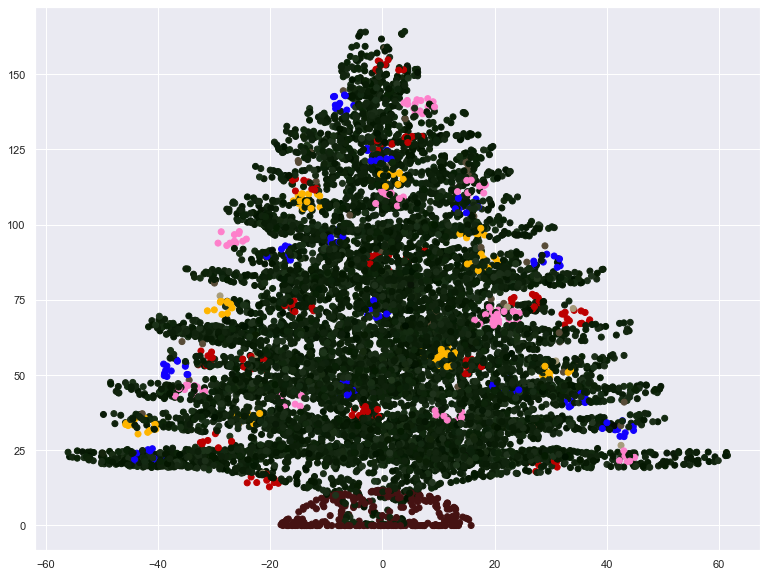

In [39]:
plt.figure(figsize = (13,10))
plt.scatter(df_sample.x,df_sample.z, c = df_sample[["r","g","b"]].values/256)
plt.show()

## Show me some perspective

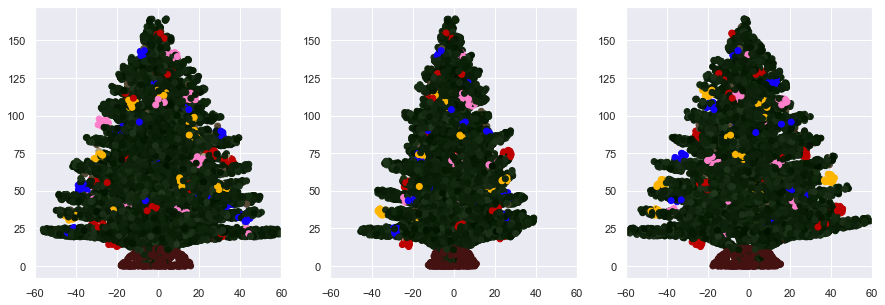

In [43]:
plt.figure(figsize = (15,5))

plt.subplot(1,3,1)
plt.scatter(df_sample.x,df_sample.z, c = df_sample[["r","g","b"]].values/256)
plt.xlim(-60,60)

plt.subplot(1,3,2)
plt.scatter((df_sample.x+df_sample.y)/2,df_sample.z, c = df_sample[["r","g","b"]].values/256)
plt.xlim(-60,60)

plt.subplot(1,3,3)
plt.scatter(df_sample.y,df_sample.z, c = df_sample[["r","g","b"]].values/256)
plt.xlim(-60,60)

plt.show()

# Mapper

In [44]:
X = df_sample[["x","y","z"]].values

## Filter function: Identity 

In [45]:
pipeline = mp.mapper.make_mapper_pipeline(filter_func = None,
                                          cover=mp.cover.CubicalCover(n_intervals = 20, overlap_frac = 0.25),
                                          verbose=True,
                                         )

graph = pipeline.fit_transform(X)

[Pipeline] ............ (step 1 of 3) Processing scaler, total=   0.0s
[Pipeline] ....... (step 2 of 3) Processing filter_func, total=   0.0s
[Pipeline] ............. (step 3 of 3) Processing cover, total=   0.4s
[Pipeline] .... (step 1 of 3) Processing pullback_cover, total=   0.4s
[Pipeline] ........ (step 2 of 3) Processing clustering, total=   1.9s
[Pipeline] ............. (step 3 of 3) Processing nerve, total=  58.0s


In [56]:
# plot
node_elements = nx.get_node_attributes(graph, 'elements')

pos = dict()
node_colors = []
i=0
for n in node_elements.keys(): 
    pos[n] = X[node_elements[n]].mean(axis = 0)
    node_colors.append(df_sample.loc[node_elements[n],["r","g","b"]].mean().values/256)
    i+=1
#pos = nx.spring_layout(graph, seed=0, dim=3)
#pos = nx.kamada_kawai_layout(graph, dim = 3)
#pos = nx.layout.spectral_layout(graph, dim = 3)


node_text = [k for k in node_elements.keys()]
node_sizes = [len(el) for el in node_elements.values()]

fig = visualize.create_network_3d(graph, 
                                pos, 
                                200*node_sizes, 
                                "green",#node_colors,
                                node_text, 
                                node_scale=12)


#fig.update_layout(width=700,height=700,margin=go.layout.Margin(t=20,l=200,r=50))
fig.show()

## Filter function: Vertical axis

In [73]:
pipeline = mp.mapper.make_mapper_pipeline(filter_func = mp.filter.Projection(column_indices=2),
                                          cover=mp.cover.OneDimensionalCover(n_intervals = 500, overlap_frac = 0.25),
                                          verbose=True,
                                         )

graph = pipeline.fit_transform(X)

[Pipeline] ............ (step 1 of 3) Processing scaler, total=   0.0s
[Pipeline] ....... (step 2 of 3) Processing filter_func, total=   0.0s
[Pipeline] ............. (step 3 of 3) Processing cover, total=   0.3s
[Pipeline] .... (step 1 of 3) Processing pullback_cover, total=   0.3s
[Pipeline] ........ (step 2 of 3) Processing clustering, total=   0.5s
[Pipeline] ............. (step 3 of 3) Processing nerve, total=   2.9s


In [74]:
# plot
node_elements = nx.get_node_attributes(graph, 'elements')

pos = dict()
node_colors = []
i=0
for n in node_elements.keys(): 
    pos[n] = X[node_elements[n]].mean(axis = 0)
    node_colors.append(df_sample.loc[node_elements[n],["r","g","b"]].mean().values/256)
    i+=1
#pos = nx.spring_layout(graph, seed=0, dim=3)
#pos = nx.kamada_kawai_layout(graph, dim = 3)
#pos = nx.layout.spectral_layout(graph, dim = 3)


node_text = [k for k in node_elements.keys()]
node_sizes = [len(el) for el in node_elements.values()]

fig = mp.visualize.create_network_3d(graph, 
                                    pos, 
                                    [20]*len(node_sizes),#node_sizes, 
                                    node_colors, 
                                    node_text, 
                                    node_scale=12)


fig.update_layout(width=700,height=700,margin=go.layout.Margin(t=20,l=200,r=50))
fig.show()

## Filter function: Centrality

In [82]:
pipeline = mp.mapper.make_mapper_pipeline(filter_func = mp.filter.Eccentricity(1),
                                          cover=mp.cover.OneDimensionalCover(n_intervals = 1000, overlap_frac = 0.45),
                                          verbose=True,
                                         )

graph = pipeline.fit_transform(X)

[Pipeline] ............ (step 1 of 3) Processing scaler, total=   0.0s
[Pipeline] ....... (step 2 of 3) Processing filter_func, total=   2.8s
[Pipeline] ............. (step 3 of 3) Processing cover, total=   0.9s
[Pipeline] .... (step 1 of 3) Processing pullback_cover, total=   3.7s
[Pipeline] ........ (step 2 of 3) Processing clustering, total=   1.0s
[Pipeline] ............. (step 3 of 3) Processing nerve, total=   9.4s


In [83]:
# plot
node_elements = nx.get_node_attributes(graph, 'elements')

pos = dict()
node_colors = []
i=0
for n in node_elements.keys(): 
    pos[n] = X[node_elements[n]].mean(axis = 0)
    node_colors.append(df_sample.loc[node_elements[n],["r","g","b"]].mean().values/256)
    i+=1
#pos = nx.spring_layout(graph, seed=0, dim=3)
#pos = nx.kamada_kawai_layout(graph, dim = 3)
#pos = nx.layout.spectral_layout(graph, dim = 3)


node_text = [k for k in node_elements.keys()]
node_sizes = [len(el) for el in node_elements.values()]

fig = mp.visualize.create_network_3d(graph, 
                                    pos, 
                                    [20]*len(node_sizes),#node_sizes, 
                                    node_colors, 
                                    node_text, 
                                    node_scale=12)


fig.update_layout(width=700,height=700,margin=go.layout.Margin(t=20,l=200,r=50))
fig.show()